# Vietnamese Handwritten Recognition with CRNN model

![](https://i.imgur.com/jbXXTch.png)
![](https://i.imgur.com/zGD3czq.jpg)

## Load Data

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    # RIP Training time
    raise SystemError('GPU device not found')
    print('Found GPU at: {}'.format(device_name))

In [ ]:
TRAIN_DATA_ZIP_PATH = "/data/Train_Data.zip"

In [ ]:
import zipfile
with zipfile.ZipFile(TRAIN_DATA_ZIP_PATH, 'r') as zip_ref:
    zip_ref.extractall("vietnamese_hcr/raw")

In [ ]:
import pathlib
# finding where we are so we dont need to type absolute path everytime
current_directory_path = pathlib.Path("./vietnamese_hcr").absolute()
current_directory_path

PosixPath('/content/vietnamese_hcr')

In [ ]:
import os
# path to our directory images

# our train and test folder (not used for now but used later when we want to save images after processing)
DATA_PATH = os.path.join(str(current_directory_path), "data")
TEST_FOLDER = os.path.join(DATA_PATH, "test")
TRAIN_FOLDER = os.path.join(DATA_PATH, "train")

# our raw folders
RAW_FOLDER = os.path.join(str(current_directory_path),"raw")

# label json files
TRAIN_JSON = os.path.join(RAW_FOLDER, "labels.json")

In [ ]:
RAW_FOLDER

'/content/vietnamese_hcr/raw'

In [ ]:
TRAIN_JSON

'/content/vietnamese_hcr/raw/labels.json'

In [ ]:
os.makedirs(DATA_PATH)
os.makedirs(TEST_FOLDER)
os.makedirs(TRAIN_FOLDER)

In [ ]:
import json
# open these label jsons files
with open(TRAIN_JSON, 'r', encoding='utf8') as f:
    train_labels = json.load(f)

Here are the labels for each image!

In [ ]:
train_labels

{'1.jpg': 'Số 3 Nguyễn Ngọc Vũ, Hà Nội',
 '2.jpg': 'Số 30 Nguyên Hồng, Láng Hạ, Đống Đa, Hà Nội',
 '3.jpg': '58 Thái Thịnh, Đống Đa, Hà Nội',
 '4.jpeg': 'Số 370/8 khu phố 5B, phường Tân Biên, Biên Hòa, Đồng Nai',
 '5.jpg': 'Vĩnh Trung Plaza, B, 255-257 đường Hùng Vương, phường Vĩnh Trung',
 '6.jpg': 'Tòa nhà 34T, Hoàng Đạo Thúy, Hà Nội',
 '7.jpg': '40 Cát Linh, Đống Đa, Hà Nội',
 '8.jpg': 'phòng 101, tầng 1, lô 04-TT5B, khu đô thị Tây Nam Linh Đàm',
 '9.JPG': 'Nhà 87 ngõ 416 Đê La Thành',
 '10.JPG': 'Up coworking Space, 89 Láng Hạ, Hà Nội',
 '11.jpg': '192 Ngô Đức Kế, quận 1, Hồ Chí Minh',
 '12.jpg': 'số 5 Công Trường Mê Linh, phường Bến Nghé, quận 1',
 '13.jpg': '90A đường Mai Xuân Thưởng, tỉnh Gia Lai',
 '14.jpg': '96/7/12B Phạm Văn Đồng, thành phố Pleiku',
 '15.jpg': '168 Ngô Gia Tự, thành phố Hà Tĩnh',
 '0000_samples.png': 'Số 253 đường Trần Phú, Thị trấn Nam Sách, Huyện Nam Sách, Hải Dương',
 '0001_samples.png': 'Số 289 Đinh Bộ Lĩnh, Phường 26, Quận Bình Thạnh, TP Hồ Chí Minh',
 '

In [ ]:
#find all characters in labels (so we don't blindly add chacters not even existed in our dataset)
char_list= set()
for label in train_labels.values():
    char_list.update(set(label))
char_list=sorted(char_list)
len(char_list)

140

So there are up to 140 unique characters in this Vietnamese dataset for addresses! Very interesting!

In [ ]:
# show all possible labels characters
"".join(char_list)

" #'()+,-./0123456789:ABCDEFGHIJKLMNOPQRSTUVWXYabcdeghiklmnopqrstuvwxyzÂÊÔàáâãèéêìíòóôõùúýăĐđĩũƠơưạảấầẩậắằẵặẻẽếềểễệỉịọỏốồổỗộớờởỡợụủỨứừửữựỳỵỷỹ"

In [ ]:
# convert the words to array of indexs based on the char_list
def encode_to_labels(txt):
    # encoding each output word into digits of indexes
    dig_lst = []
    for index, char in enumerate(txt):
        try:
            dig_lst.append(char_list.index(char))
        except:
            print("No found in char_list :", char)
        
    return dig_lst

In [ ]:
encode_to_labels("Life is hard")

No found in char_list : f


[32, 53, 50, 0, 53, 62, 0, 52, 46, 61, 49]

In [ ]:
# find all image paths for train folder 1 and 2 and test folder
train_image_path = []

for item in pathlib.Path(RAW_FOLDER).glob('**/*'):
    if item.is_file() and item.suffix not in [".json"]:
        train_image_path.append(str(item))

In [ ]:
train_image_path[:10]

['/content/vietnamese_hcr/raw/0261_samples.png',
 '/content/vietnamese_hcr/raw/1445_samples.png',
 '/content/vietnamese_hcr/raw/1065_samples.png',
 '/content/vietnamese_hcr/raw/0453_samples.png',
 '/content/vietnamese_hcr/raw/0628_samples.png',
 '/content/vietnamese_hcr/raw/0334_samples.png',
 '/content/vietnamese_hcr/raw/1676_samples.png',
 '/content/vietnamese_hcr/raw/0283_samples.png',
 '/content/vietnamese_hcr/raw/1321_samples.png',
 '/content/vietnamese_hcr/raw/0577_samples.png']

You can see that there is no f in Vietnamese language, we are so nice as people ! What are other characters not existing in Vietnamese?

## Preprocessing

#### Here what we gonna do now:
- Find all widths and heights of images
- Use openCV to read image 
- Preprocess images (like converting images to greyscale)
- Resize images so all images will have the same size
- Split your dataset into trainset and testset
- Build CRNN model with CTC loss
- Prediction
- Calculate metrics for SER, WER and CER

In [ ]:
# YOUR CODE: Continue to preprocess dataset and create CRNN model with CTC loss!

#Matching full absoluate paths and labels instead of filenames and labels 
dict_filepath_label={}
raw_data_path = pathlib.Path(os.path.join(RAW_FOLDER))
for item in raw_data_path.glob('**/*.*'):
    file_name=str(os.path.basename(item))
    if file_name != "labels.json":
      label = train_labels[file_name]
      dict_filepath_label[str(item)]=label

In [ ]:
dict_filepath_label

{'/content/vietnamese_hcr/raw/0261_samples.png': 'Khu Lâm Thao, Thị trấn Lâm Thao, Huyện Lâm Thao, Phú Thọ',
 '/content/vietnamese_hcr/raw/1445_samples.png': '729 âu Cơ, Phường Tân Thành, Quận Tân phú, TP Hồ Chí Minh',
 '/content/vietnamese_hcr/raw/1065_samples.png': 'Xóm 6, Xã Ngũ Lão, Huyện Thuỷ Nguyên, Hải Phòng',
 '/content/vietnamese_hcr/raw/0453_samples.png': '157 Lâm Văn Bền, Phường Bình Thuận, Quận 7, TP Hồ Chí Minh',
 '/content/vietnamese_hcr/raw/0628_samples.png': '76 Thành Thái, Phường Khuê Trung, Quận Cẩm Lệ, Đà Nẵng',
 '/content/vietnamese_hcr/raw/0334_samples.png': 'Kp10, P. An Bình, Thành Phố Biên Hoà, Đồng Nai',
 '/content/vietnamese_hcr/raw/1676_samples.png': '636/29 đường 30/4, Phường Hưng Lợi, Quận Ninh Kiều, Cần Thơ',
 '/content/vietnamese_hcr/raw/0283_samples.png': '18C Phạm Đình Hổ, Phường Phạm Đình Hổ, Quận Hai Bà Trưng, Hà Nội',
 '/content/vietnamese_hcr/raw/1321_samples.png': 'Số 583, khu phố 2, Phường Mỹ Phước, Thị Xã Bến Cát, Bình Dương',
 '/content/vietnames

In [ ]:
# find the maximum label length
label_lens= []
for label in dict_filepath_label.values():
    label_lens.append(len(label))
max_label_len = max(label_lens)

max_label_len

69

In [ ]:
all_image_paths = list(dict_filepath_label.keys())

In [ ]:
all_image_paths[:10]

['/content/vietnamese_hcr/raw/0261_samples.png',
 '/content/vietnamese_hcr/raw/1445_samples.png',
 '/content/vietnamese_hcr/raw/1065_samples.png',
 '/content/vietnamese_hcr/raw/0453_samples.png',
 '/content/vietnamese_hcr/raw/0628_samples.png',
 '/content/vietnamese_hcr/raw/0334_samples.png',
 '/content/vietnamese_hcr/raw/1676_samples.png',
 '/content/vietnamese_hcr/raw/0283_samples.png',
 '/content/vietnamese_hcr/raw/1321_samples.png',
 '/content/vietnamese_hcr/raw/0577_samples.png']

In [ ]:
import cv2
# find all widths and heights of images (this is useful if our dataset images got different sizes)
widths = []
heights = []
for image_path in all_image_paths:
    img = cv2.imread(image_path)
    (height, width, _) = img.shape
    heights.append(height)
    widths.append(width)

In [ ]:
min_height = min(heights)
max_height = max(heights)
min_width = min(widths)
max_width = max(widths)

In [ ]:
# this information is useful for making decision for padding and resizing
(min_height, max_height, min_width, max_width)

(94, 376, 955, 2694)

In [ ]:
# being a good Data Scientist, we need to have train set and test set
from sklearn.model_selection import train_test_split
test_size = 0.2
train_image_paths, val_image_paths = train_test_split(all_image_paths, test_size=test_size, random_state=42)

In [ ]:
# Constants (we choose this number as we later discover that the output of our CNN is (1,9,512) from out input)
TIME_STEPS = 240

In [ ]:
# BUILD THE PIPELINE FOR THE IMAGES, definitely this is super basic pipeline and can be improved

import numpy as np

# lists for training dataset
training_img = []
training_txt = []
train_input_length = []
train_label_length = []
orig_txt = []
resize_max_width=0
i=0
for train_img_path in train_image_paths:
    # print(f_name)
    # read input image and convert into gray scale image
    img = cv2.cvtColor(cv2.imread(train_img_path), cv2.COLOR_BGR2GRAY)
    
    height, width = img.shape

    # in this dataset, we don't need to do any resize at all here.
    img = cv2.resize(img,(int(118/height*width),118))
    
    height, width = img.shape
    
    if img.shape[1] > resize_max_width:
        resize_max_width = img.shape[1]

    img = np.pad(img, ((0,0),(0, 2167-width)), 'median')
    
    # YOUR PART: Blur it
    img = cv2.GaussianBlur(img, (5,5), 0)

    # YOUR PART: Threshold the image using adapative threshold
    img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 4)
    
    # add channel dimension
    img = np.expand_dims(img , axis = 2)
    
    # Normalize each image
    img = img/255.

    label = dict_filepath_label[train_img_path]

    # split data into validation and training dataset as 10% and 90% respectively
    orig_txt.append(label)   
    train_label_length.append(len(label))

    # our time steps for valid input
    train_input_length.append(TIME_STEPS)
    training_img.append(img)

    # convert words to digits based on charlist
    training_txt.append(encode_to_labels(label)) 
    i+=1
    if (i%500 == 0):
        print ("has processed trained {} files".format(i))
print(resize_max_width)

has processed trained 500 files
has processed trained 1000 files
2167


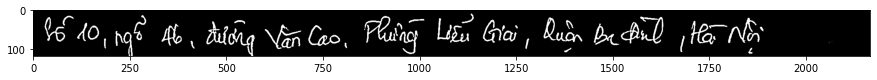

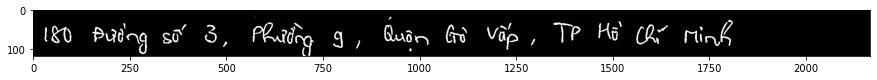

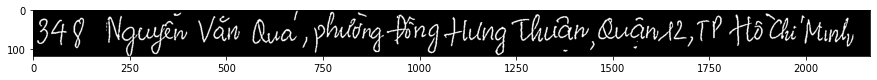

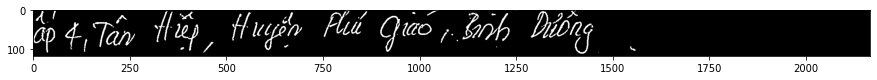

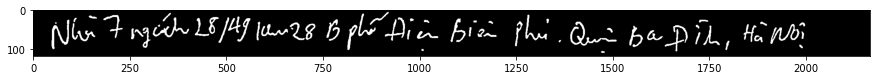

In [ ]:
import matplotlib.pyplot as plt
for i in range(5):
    plt.figure(figsize=(15,2))
    plt.imshow(training_img[i][:,:,0], cmap="gray")
    plt.show()

In [ ]:
#lists for validation dataset
valid_img = []
valid_txt = []
valid_input_length = []
valid_label_length = []
valid_orig_txt = []

i=0

for val_img_path in val_image_paths:
    # print(f_name)
    # read input image and convert into gray scale image
    img = cv2.cvtColor(cv2.imread(val_img_path), cv2.COLOR_BGR2GRAY)
    
    # in this dataset, we don't need to do any resize at all here.
    img = cv2.resize(img,(int(118/height*width),118))
    
    if img.shape[1] > resize_max_width:
        resize_max_width = img.shape[1]
        
    img = np.pad(img, ((0,0),(0, 2167-width)), 'median')
    
    # YOUR PART: Blur it
    img = cv2.GaussianBlur(img, (5,5), 0)

    # YOUR PART: Threshold the image using adapative threshold
    img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 4)
    
    # add channel dimension
    img = np.expand_dims(img , axis = 2)
    
    # Normalize each image
    img = img/255.

    label = dict_filepath_label[val_img_path]

    valid_orig_txt.append(label)   
    valid_label_length.append(len(label))

    # our time steps for valid input
    valid_input_length.append(TIME_STEPS)
    valid_img.append(img)

    # convert words to digits based on charlist
    valid_txt.append(encode_to_labels(label))
    i+=1
    if (i%500 == 0):
        print ("has processed test {} files".format(i))
print(resize_max_width)

2167


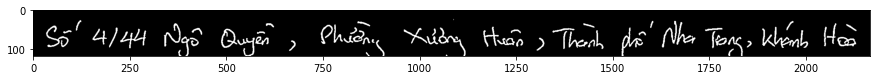

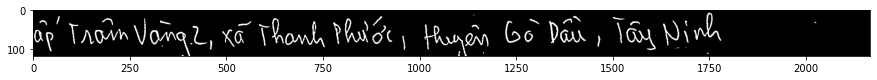

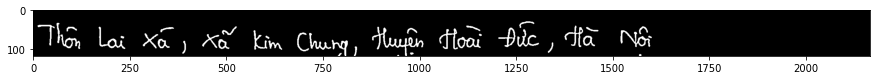

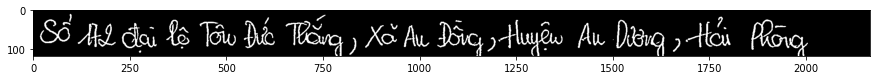

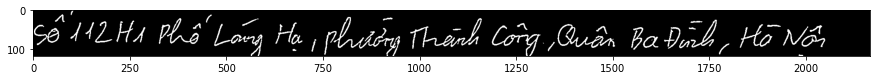

In [ ]:
import matplotlib.pyplot as plt
for i in range(5):
    plt.figure(figsize=(15,2))
    plt.imshow(valid_img[i][:,:,0], cmap="gray")
    plt.show()

In [ ]:
# this is the most controversial part when our max_label_len should be set different or slightly smaller than TIME_STEPS
# but let stick to the conventional/normal way: we should to be the same with our TIME_STEPS
max_label_len = TIME_STEPS 

In [ ]:
# import padding library
from tensorflow.keras.preprocessing.sequence import pad_sequences

# pad each output label to maximum text length, remember we did that so that we keep training with rnn consistent?
train_padded_txt = pad_sequences(training_txt, maxlen=max_label_len, padding='post', value = 0)
valid_padded_txt = pad_sequences(valid_txt, maxlen=max_label_len, padding='post', value = 0)

In [ ]:
train_padded_txt[0]

array([ 39, 118,   0,  11,  10,   6,   0,  57,  51,  85,   0,  14,  16,
         6,   0,  91,  96, 124,  57,  51,   0,  42,  89,  57,   0,  23,
        46,  58,   6,   0,  36,  52,  96, 124,  57,  51,   0,  32,  53,
       112,  64,   0,  27,  53,  46,  53,   6,   0,  37,  64, 102,  57,
         0,  22,  46,   0,  90,  80,  57,  52,   6,   0,  28,  73,   0,
        34, 122,  53,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   

## Model Building

In [ ]:
# import our model, different layers and activation function 
from tensorflow.keras.layers import Dense, LSTM, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional, Add, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.activations import relu, sigmoid, softmax
import tensorflow.keras.backend as K
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import CSVLogger, TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

In [ ]:
# OUR FULL MODEL OF CRNN AND LSTM

# input with shape of height=32 and width=128 
inputs = Input(shape=(118,2167,1))
 
# Block 1
x = Conv2D(64, (3,3), padding='same')(inputs)
x = MaxPool2D(pool_size=3, strides=3)(x)
x = Activation('relu')(x)
x_1 = x 

# Block 2
x = Conv2D(128, (3,3), padding='same')(x)
x = MaxPool2D(pool_size=3, strides=3)(x)
x = Activation('relu')(x)
x_2 = x

# Block 3
x = Conv2D(256, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x_3 = x

# Block4
x = Conv2D(256, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Add()([x,x_3])
x = Activation('relu')(x)
x_4 = x

# Block5
x = Conv2D(512, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x_5 = x

# Block6
x = Conv2D(512, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Add()([x,x_5])
x = Activation('relu')(x)

# Block7
x = Conv2D(1024, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(3, 1))(x)
x = Activation('relu')(x)

# pooling layer with kernel size (2,2) to make the height/2 #(1,9,512)
x = MaxPool2D(pool_size=(3, 1))(x)
 
# # to remove the first dimension of one: (1, 31, 512) to (31, 512) 
squeezed = Lambda(lambda x: K.squeeze(x, 1))(x)
 
# # # bidirectional LSTM layers with units=128
blstm_1 = Bidirectional(LSTM(512, return_sequences=True, dropout = 0.2))(squeezed)
blstm_2 = Bidirectional(LSTM(512, return_sequences=True, dropout = 0.2))(blstm_1)

# # this is our softmax character proprobility with timesteps 
outputs = Dense(len(char_list)+1, activation = 'softmax')(blstm_2)

# model to be used at test time

act_model = Model(inputs, outputs)

In [ ]:
act_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 118, 2167, 1 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 118, 2167, 64 640         input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 39, 722, 64)  0           conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 39, 722, 64)  0           max_pooling2d[0][0]              
______________________________________________________________________________________________

In [ ]:
### ctc definition part 
"""
The reason why we use ctc_batch_cost instead of ctc_cost because
In batch cost, the program managed to mask out padded sequence using label_length, 
So the cost won't include the padding 0 section.
"""

"""
The way CTC is modelled currently in Keras is that you need to implement the loss function as a layer, you did that already (loss_out). 
Your problem is that the inputs you give that layer are not tensors from Theano/TensorFlow but numpy arrays.
To change that one option is to model these values as inputs to your model.
That is why we need to manually create Input for labels, input length and label_length.
"""

# define the label input shape for ctc
labels = Input(name='the_labels', shape=[max_label_len], dtype='float32')

"""
where input_length and label_length are constants you created previously
the easiest way here is to have a fixed batch size in training 
the lengths should have the same batch size (see shapes in the link for ctc_cost)   
"""

# define the length of input and label for ctc
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')
 
# define a ctc lambda function to take arguments and return ctc_bach_cost
def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    """
    labels: tensor (number of samples, max_string_length) containing the truth labels.
    y_pred: tensor (number of samples, time_steps, num_character_labels) containing the prediction, or output of the softmax.
    input_length: tensor (number of samples, 1) containing the sequence length for each batch item in y_pred.
    label_length: tensor (number of samples, 1) containing the sequence length for each batch item in y_true.
    """
    return K.ctc_batch_cost(labels, y_pred, input_length, label_length)
 
# out loss function (just take the inputs and put it in our ctc_batch_cost)
loss_out = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([outputs, labels, input_length, label_length])

#model to be used at training time
model = Model(inputs=[inputs, labels, input_length, label_length], outputs=loss_out)

In [ ]:
# ready ctc loss function and optimizers
model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer = 'adam')

# our callbacks hell to optimize our learning
callbacks = [
    TensorBoard(
        log_dir='./logs',
        histogram_freq=10,
        profile_batch=0,
        write_graph=True,
        write_images=False,
        update_freq="epoch"),
    ModelCheckpoint(
        filepath=os.path.join('checkpoint_weights.hdf5'),
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        verbose=1),
    EarlyStopping(
        monitor='val_loss',
        min_delta=1e-8,
        patience=20,
        restore_best_weights=True,
        verbose=1),
    ReduceLROnPlateau(
        monitor='val_loss',
        min_delta=1e-8,
        factor=0.2,
        patience=10,
        verbose=1)
]
callbacks_list = callbacks

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 118, 2167, 1 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 118, 2167, 64 640         input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 39, 722, 64)  0           conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 39, 722, 64)  0           max_pooling2d[0][0]              
____________________________________________________________________________________________

In [ ]:
# notice I convert everything to numpy array here since model can fit either tensors and numpy array
# the reason why i stick with numpy array because it is simple to code and also because it is baseline solution
# I want to use openCV (can't run with tensors because it is CPU operations)
# And if I want to use tensors then i will make sure my image preprocessing functions uses tensor compatible operations

# ready our training data
training_img = np.array(training_img)
train_input_length = np.array(train_input_length)  # all must be equal length to T timesteps
train_label_length = np.array(train_label_length)  # different length (only the same in Captcha dataset)

# ready our validating data
valid_img = np.array(valid_img)
valid_input_length = np.array(valid_input_length) # all must be equal length to T timesteps
valid_label_length = np.array(valid_label_length) # different length (only the same in Captcha dataset)



In [ ]:
# choose batchsize and epochs

batch_size = 32
epochs = 100

history = model.fit(x=[training_img, train_padded_txt, train_input_length, train_label_length], 
          y=np.zeros(len(training_img)),
          batch_size=batch_size, 
          epochs = epochs,
          validation_data = ([valid_img, valid_padded_txt, valid_input_length, valid_label_length], [np.zeros(len(valid_img))]),
          verbose = 1, callbacks = callbacks_list)

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/100
46/46 [==============================] - 178s 3s/step - loss: 230.1687 - val_loss: 202.1221

Epoch 00001: val_loss improved from inf to 202.12209, saving model to checkpoint_weights.hdf5
Epoch 2/100
46/46 [==============================] - 112s 2s/step - loss: 200.8576 - val_loss: 198.8865

Epoch 00002: val_loss improved from 202.12209 to 198.88652, saving model to checkpoint_weights.hdf5
Epoch 3/100
46/46 [==============================] - 112s 2s/step - loss: 195.3072 - val_loss: 249.0145

Epoch 00003: val_loss did not improve from 198.88652
Epoch 4/100
46/46 [==============================] - 112s 2s/step - loss: 174.9296 - val_loss: 282.8740

Epoch 00004: val_loss did not improve from 198.88652
Epoch 5/100
46/46 [==============================] - 112s 2s/step - loss: 146.6501 - val_loss: 331.8440

Epoch 00005: val_loss did not improve from 198.88652
Epoch 6/100
46/46 [==============================] - 112s 2s/step - loss: 126.5777 - val_loss: 529.2548

Epoch 00006: val_

## Evaluation

In [ ]:
# load the saved best model weights
act_model.load_weights(os.path.join('checkpoint_weights.hdf5'))

In [ ]:
# predict outputs on validation images
NO_PREDICTS = 100
OFFSET=0
# prediction = act_model.predict(valid_img[OFFSET:OFFSET+NO_PREDICTS])
prediction = act_model.predict(valid_img)

In [ ]:
# NO_PREDICTS image results
# 9 timesteps
# 32 chars + 1 blank
prediction.shape

(368, 240, 141)

In [ ]:
# use CTC decoder
out = K.get_value(K.ctc_decode(prediction, input_length=np.ones(prediction.shape[0])*prediction.shape[1],
                         greedy=True)[0][0])
# see the results
all_predictions =[]
i = 0
for x in out:
    print("original_text  = ", valid_orig_txt[i+OFFSET])
    print("predicted text = ", end = '')
    pred = ""
    for p in x:  
        if int(p) != -1:
            pred += char_list[int(p)]
    print(pred)
    all_predictions.append(pred)
    i+=1

original_text  =  Số 4/44 Ngô Quyền, Phường Xương Huân, Thành phố Nha Trang, Khánh Hòa
predicted text = Số 4/44 Ngô Quyền, Phường Xương Huân, Thành pố Nha Trng, Khánh Hòa
original_text  =  ấp Trâm Vàng2, xã Thanh Phước, Huyện Gò Dầu, Tây Ninh
predicted text = ấp Trânm Văng 2, Xã Thanh Phước, Huyện Gò Dầu, Tây Ninh
original_text  =  Thôn Lai Xá, Xã Kim Chung, Huyện Hoài Đức, Hà Nội
predicted text = Thôn Lai Xã, Xã Kim Chung, Huyện Hoài Đức, Hà Nội
original_text  =  Số 172 đại lộ Tôn Đức Thắng, Xã An Đồng, Huyện An Dương, Hải Phòng
predicted text = Số N2 đại lộ Tôn Đức Thắng, Xã Au Đồng, Huyện Au Dương, Hải Phòng
original_text  =  số 112 H1 phố Láng Hạ, phường Thành Công, Quận Ba Đình, Hà Nội
predicted text = Số 112H1 Phố Láng Hạ, Phường Thành Công, Quận Ba Đình, Hà Nội
original_text  =  1289 Nguyễn Tất Thành, Phường Xuân Hà, Quận Thanh Khê, Đà Nẵng
predicted text = 1289 Nyễn Trấi Thành, Phường Xuhà Hà, Quận Thanh Khê, Đà Nẵng
original_text  =  387 Đào Trí, Phường Phú Thuận, Quận 7, TP H

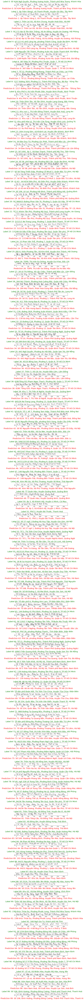

In [ ]:
#YOUR PART: WRITE TO PRINT OUT THE IMAGES IN NICE 2D ARRAY PLOT WITH ORIGINAL TEXT AND PREDICTED TEXT 
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.figure(figsize=(10,200))
col=0
row=1
gs1 = gridspec.GridSpec(NO_PREDICTS, 1)
# gs1.update(wspace=0.025, hspace=0.025)
for n in range(NO_PREDICTS):
    plt.subplot(gs1[n])
    plt.imshow(valid_img[n][:,:,0], cmap="gray_r")
    plt.title(f"Label {n}: "+valid_orig_txt[n+OFFSET], fontsize=20, color="green")
    plt.xlabel(f"Prediction {n}: "+all_predictions[n+OFFSET], fontsize=20, color="red")


In [ ]:
import string
import unicodedata
import editdistance


def ocr_metrics(predicts, ground_truth, norm_accentuation=False, norm_punctuation=False):
    """Calculate Character Error Rate (CER), Word Error Rate (WER) and Sequence Error Rate (SER)"""

    if len(predicts) == 0 or len(ground_truth) == 0:
        return (1, 1, 1)

    cer, wer, ser = [], [], []

    for (pd, gt) in zip(predicts, ground_truth):

        if norm_accentuation:
            pd = unicodedata.normalize("NFKD", pd).encode("ASCII", "ignore").decode("ASCII")
            gt = unicodedata.normalize("NFKD", gt).encode("ASCII", "ignore").decode("ASCII")

        if norm_punctuation:
            pd = pd.translate(str.maketrans("", "", string.punctuation))
            gt = gt.translate(str.maketrans("", "", string.punctuation))

        pd_cer, gt_cer = list(pd.lower()), list(gt.lower())
        dist = editdistance.eval(pd_cer, gt_cer)
        cer.append(dist / (max(len(pd_cer), len(gt_cer))))

        pd_wer, gt_wer = pd.lower().split(), gt.lower().split()
        dist = editdistance.eval(pd_wer, gt_wer)
        wer.append(dist / (max(len(pd_wer), len(gt_wer))))

        pd_ser, gt_ser = [pd], [gt]
        dist = editdistance.eval(pd_ser, gt_ser)
        ser.append(dist / (max(len(pd_ser), len(gt_ser))))

    cer_f = sum(cer) / len(cer)
    wer_f = sum(wer) / len(wer)
    ser_f = sum(ser) / len(ser)

    return (cer_f, wer_f, ser_f)

In [ ]:
evaluate = ocr_metrics(predicts=all_predictions,
                                  ground_truth=valid_orig_txt,
                                  norm_accentuation=False,
                                  norm_punctuation=False)

e_corpus = "\n".join([
    "Metrics:",
    "Character Error Rate: {}".format(evaluate[0]),
    "Word Error Rate:      {}".format(evaluate[1]),
    "Sequence Error Rate:  {}".format(evaluate[2]),
])

In [ ]:
print(e_corpus)

Metrics:
Character Error Rate: 0.04761427177354741
Word Error Rate:      0.15659406463634423
Sequence Error Rate:  0.8097826086956522


We got a pretty good results with CER at 4% and WER at 15%! I'm certain if I continue to apply for other techniques, this will help to reduce these numbers down. For example, I can try add to an attention layer between my CNN and RNN layers. 

## Tensorboard

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

As we can see, the loss for validation continue to increase for the first 6 epoches and sharply drop onwards and mostly stable all the way till epoch 80.

Things to improve for the competition:
- Resize image logics with multiple image sizes (maybe as following):
    + find min, max of height and width
    + resize to a fixed height you want
    + calculate the max width of all resized images
    + padding to all images to that max width
- Combine the logic of preprocessing of train set and test set together
- Convert them to tfdataset pipeline (note that it is challenging since OpenCV won't work with tensor)
- Rework/redesign new CRNN model to fit with the new processed images. 